<a href="https://colab.research.google.com/github/nickselv/Bayesian_Statistics_Project/blob/main/CLUSTERING_UNIVARIATE_C.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# LIBRARY AND DATASET PREPARATION

In [ ]:
import numpy as np
import pandas as pd
import math
import os
import csv
import matplotlib.pyplot as plt
import glob
import xlrd
from datetime import datetime, timedelta
import folium
import matplotlib.cm as cm
import calendar
from google.colab import drive
import matplotlib.pyplot as plt
import statistics
from math import sqrt

In [ ]:
!pip install git+https://github.com/OriolAbril/arviz.git@ci

  Cloning https://github.com/OriolAbril/arviz.git (to revision ci) to /tmp/pip-req-build-tbuh254f
  Running command git clone --filter=blob:none --quiet https://github.com/OriolAbril/arviz.git /tmp/pip-req-build-tbuh254f
  Running command git checkout -b ci --track origin/ci
  Switched to a new branch 'ci'
  Branch 'ci' set up to track remote branch 'ci' from 'origin'.
  Resolved https://github.com/OriolAbril/arviz.git to commit 7c20182c25b0b5e9af8242d1ee4d1185ae82b70a
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for arviz: filename=arviz-0.17.0.dev0-py3-none-any.whl size=1651459 sha256=48435264a3a1528c0d94479284a9741f0cabaacca72257ff6a8882010bd25e8f
  Stored in directory: /tmp/pip-ephem-wheel-cache-0qp2sdpz/wheels/46/1e/6c/46b9c646a79d4a0f01b37df1c2c0abcc4e7129fe66e88e9b0f
Successfully built arviz
  Attempting uninstall: arviz
    Found existing installation: arviz 0.15.1
    Unin

In [ ]:
from cmdstanpy import install_cmdstan
install_cmdstan(compiler = True)

CmdStan install directory: /root/.cmdstan
Installing CmdStan version: 2.34.1
Download successful, file: /tmp/tmpw66tdnmb
Extracting distribution


DEBUG:cmdstanpy:cmd: make build -j1
cwd: None


Unpacked download as cmdstan-2.34.1
Building version cmdstan-2.34.1, may take several minutes, depending on your system.


DEBUG:cmdstanpy:cmd: make examples/bernoulli/bernoulli
cwd: None


Installed cmdstan-2.34.1
Test model compilation


True

In [ ]:
import arviz as az
# Import functions
from cmdstanpy import CmdStanModel
from tensorflow_probability.substrates import numpy as tfp
tfd = tfp.distributions
from cmdstanpy import CmdStanModel

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_stan = pd.read_csv('/content/drive/MyDrive/Progetto/ingressi_orari/stan/data_stan_completo.csv', delimiter=',')
data_stan.head()

,id_varco,data,numero_transiti,giorno,festivo,longitude,latitude,nome_varco,precipitazioni,av_temp,nord,sud,est,ovest,estate,inverno
0,1,2023-01-01,1598,Sunday,1,9.181736,45.477615,PORTA TENAGLIA,3.8,8.354167,1,0,0,0,0,1
1,2,2023-01-01,2859,Sunday,1,9.181095,45.476948,LEGNANO,3.8,8.354167,1,0,0,0,0,1
2,3,2023-01-01,491,Sunday,1,9.181903,45.478283,MOSCOVA,3.8,8.354167,1,0,0,0,0,1
3,4,2023-01-01,1622,Sunday,1,9.182925,45.480523,VOLTA,3.8,8.354167,1,0,0,0,0,1
4,5,2023-01-01,236,Sunday,1,9.186530,45.480148,GARIBALDI,3.8,8.354167,1,0,0,0,0,1


In [ ]:
data_stan.tail(5)

,id_varco,data,numero_transiti,giorno,festivo,longitude,latitude,nome_varco,precipitazioni,av_temp,nord,sud,est,ovest,estate,inverno
14595,36,2023-12-31,953,Sunday,1,9.166858,45.467772,XX SETTEMBRE,11.8,7.7,0,0,0,1,0,1
14596,37,2023-12-31,1180,Sunday,1,9.166435,45.467898,BAZZONI,11.8,7.7,0,0,0,1,0,1
14597,38,2023-12-31,3246,Sunday,1,9.166059,45.469424,MASCHERONI,11.8,7.7,0,0,0,1,0,1
14598,39,2023-12-31,1209,Sunday,1,9.169088,45.470916,MONTI,11.8,7.7,0,0,0,1,0,1
14599,40,2023-12-31,2653,Sunday,1,9.170103,45.473807,MILTON,11.8,7.7,0,0,0,1,0,1


In [ ]:
data_stan['mezzi'] = 0
data_stan.loc[data_stan['id_varco'] == 17, 'mezzi'] = 1
data_stan.loc[data_stan['id_varco'] == 21, 'mezzi'] = 1
data_stan.loc[data_stan['id_varco'] == 24, 'mezzi'] = 1
data_stan.loc[data_stan['id_varco'] == 26, 'mezzi'] = 1
data_stan.loc[data_stan['id_varco'] == 34, 'mezzi'] = 1

In [ ]:
data_stan.head(40)

,id_varco,data,numero_transiti,giorno,festivo,longitude,latitude,nome_varco,precipitazioni,av_temp,nord,sud,est,ovest,estate,inverno,mezzi
0,1,2023-01-01,1598,Sunday,1,9.181736,45.477615,PORTA TENAGLIA,3.8,8.354167,1,0,0,0,0,1,0
1,2,2023-01-01,2859,Sunday,1,9.181095,45.476948,LEGNANO,3.8,8.354167,1,0,0,0,0,1,0
2,3,2023-01-01,491,Sunday,1,9.181903,45.478283,MOSCOVA,3.8,8.354167,1,0,0,0,0,1,0
3,4,2023-01-01,1622,Sunday,1,9.182925,45.480523,VOLTA,3.8,8.354167,1,0,0,0,0,1,0
4,5,2023-01-01,236,Sunday,1,9.186530,45.480148,GARIBALDI,3.8,8.354167,1,0,0,0,0,1,0
5,6,2023-01-01,156,Sunday,1,9.187839,45.479921,MILAZZO,3.8,8.354167,1,0,0,0,0,1,0
6,7,2023-01-01,999,Sunday,1,9.191497,45.479456,CASTELFIDARDO,3.8,8.354167,1,0,0,0,0,1,0
7,8,2023-01-01,4291,Sunday,1,9.195749,45.477220,TURATI,3.8,8.354167,1,0,0,0,0,1,0
8,9,2023-01-01,5313,Sunday,1,9.204511,45.474000,VENEZIA,3.8,8.354167,0,0,1,0,0,1,0
9,10,2023-01-01,118,Sunday,1,9.205038,45.471545,BARETTI,3.8,8.354167,0,0,1,0,0,1,0


In [ ]:
data_stan['precipitazioni'] = (data_stan['precipitazioni'] - data_stan['precipitazioni'].mean()) / data_stan['precipitazioni'].std()
data_stan['av_temp'] = (data_stan['av_temp'] - data_stan['av_temp'].mean()) / data_stan['av_temp'].std()

In [ ]:
n_varchi = data_stan['id_varco'].unique()
I = len(n_varchi)
coeff = np.zeros(I) # vettore di 40 elementi
data_coeff = pd.read_csv('/content/drive/MyDrive/Progetto/ingressi_orari/stan/data_CAR22.csv', delimiter=',')
for i in range(I):
  coeff[i] = data_coeff[data_coeff['id_varco']==i+1]['numero_transiti'].sum()/data_stan['numero_transiti'].sum()
del data_coeff

In [ ]:
# mappo i giorni da 1 a n_giorni disponibili
time = [datetime.strptime(d, "%Y-%m-%d").timetuple().tm_yday for d in data_stan['data']]

In [ ]:
# Costanti da passare a stan
I = len(data_stan['id_varco'].unique())
T = len(data_stan['data'].unique())

# Creo vettore output che mi serve per il modello stan
output = np.zeros((len(data_stan['id_varco'].unique()),len(data_stan['data'].unique())), dtype=int)
output = [row[:] for row in output]

# Altre robe da inizializzare per stan
time_matrix = np.reshape(time, (I, T), order='F')
lambda_matrix = np.zeros((I, T))
output_flat = np.zeros(I*T, dtype=int)

coeff_c_i = pd.read_csv('/content/drive/MyDrive/Progetto/c_i22.csv')
media = coeff_c_i['c_i.poi3']

In [ ]:
def plot_credible_interval(x,values,horizontal_line_width=0.25):
    median = np.quantile(values, 0.5)
    left = x - horizontal_line_width / 2
    bottom = np.quantile(values, 0.025)
    right = x + horizontal_line_width / 2
    top = np.quantile(values, 0.975)
    credible_interval = [bottom, top]
    plt.plot([x, x], [top, bottom],color='red')
    plt.plot([left, right], [top, top],color='red')
    plt.plot([left, right], [bottom, bottom],color='red')
    plt.plot(x, median, 'o',color='red')
    return median, credible_interval

In [ ]:
def plot_credible_interval_cluster(x, values, cluster, possible_clusters, horizontal_line_width=0.25):
    median = np.quantile(values, 0.5)
    if cluster == possible_clusters[0]:
        color ='c'
    elif cluster ==possible_clusters[1]:
        color ='r'
    else:
        color = 'g'
    left = x - horizontal_line_width / 2
    bottom = np.quantile(values, 0.025)
    right = x + horizontal_line_width / 2
    top = np.quantile(values, 0.975)

    confidence_interval = [bottom, top]
    plt.plot([x, x], [top, bottom], color=color)
    plt.plot([left, right], [top, top], color=color)
    plt.plot([left, right], [bottom, bottom], color=color)
    plt.plot(x, median, 'o', color = color)

    return median, confidence_interval

# STAN MODEL AND CREDIBLE INTERVALS

In [ ]:
data = {
    'N': data_stan.shape[0],  # Numero totale di osservazioni (spaziali-temporali)
    'T': len(data_stan['data'].unique()),  # Numero di periodi temporali unici (304)
    'I': len(data_stan['id_varco'].unique()),  # Numero di aree geografiche (40)
    'count': data_stan.groupby(['id_varco', 'data'])['numero_transiti'].sum().unstack().values.tolist(),    # Conteggi degli ingressi
    'time': time_matrix,  # Giorno dell'anno dalle date (la formula strana serve per avere valori da 1 a 304)
    'area': data_stan['id_varco'].values,        # Identificatori delle aree geografiche
    'precipitazioni': data_stan['precipitazioni'].values,    # Precipitazioni
    'av_temp': data_stan['av_temp'].values,              # Temperatura media
    'Xt': data_stan[['data', 'precipitazioni','av_temp','estate','inverno']].drop_duplicates().reset_index()[['precipitazioni', 'av_temp','estate','inverno']].transpose(),     #data_stan[['precipitazioni','av_temp']].values.transpose(),
    'Xi': data_stan[['nome_varco','mezzi']].drop_duplicates().reset_index()[['mezzi']].transpose(),
    'fixed_w1':  2*math.pi/7,
    'fixed_w2': 2*math.pi/226,  #226 = numero giorni da 1 gennaio a 15 agosto
    'output': output,
    'mu_c': media,
    'output_flat': np.zeros(I*T, dtype=int),
    'q': 1/7,
}

# Definizione del modello in Stan
stan_code = """
functions {
  // Definizione della funzione f(t)
  matrix f_matr(real a, real b, real c, real d, real w1, real w2, matrix t) {
    return a*sin(w1 * t) + b*cos(w1 * t) + c*sin(w2 * t) + d*cos(w2 * t);
  }

  matrix f_ma(real a, real b, real w, matrix A){
    int rows = rows(A);
    int cols = cols(A);
    matrix[rows, cols] result;

    for (i in 1:rows) {
      for (j in 1:cols) {
        result[i, j] = a * sin(w * A[i, j]) + b * cos(w * A[i, j]);
      }
    }
    return result;
  }


}


data {   //30
    int<lower=0> N;                       // Numero totale di osservazioni
    int<lower=0> T;                       // Numero di periodi temporali distinti   20
    int<lower=0> I;                       // Numero di aree geografiche distinti
    array[I,T] real count;             // Conteggi degli eventi
    matrix[I,T] time;        // Periodi temporali
    array[N] real area;        // Identificatori delle aree geografiche
    array[N] real precipitazioni;               // Precipitazioni
    array[N] real av_temp;                      // Temperatura media
    matrix[4,T] Xt;
    matrix[1,I] Xi;
    row_vector[I] mu_c;
    //row_vector[I] coeff;
    array[I * T] int<lower=0> output_flat;
    array[I,T] int<lower=0>  output;
    real fixed_w1;                    // Valore fisso per w
    real fixed_w2;
    real q;

} //51

parameters {

    row_vector[I] c;
    real a0;
    real b0;
    real a1;
    real b1;
    row_vector[4] beta;                    // Coefficienti per Xt

} //60



model {
    // Priors
    c ~ normal(log(mu_c), 0.2);                // c ~ normal(mu_c, 1);

    beta ~ normal(0, 2);

    a0 ~ normal(0, 6);
    b0 ~ normal(0, 6);
    //a ~ normal(5, 2);
    a1 ~ normal(0, 6);
    b1 ~ normal(0, 6);



// Modello di Poisson spazio-temporale con f(t), ci, Xt e Xi    71
    // Calculate lambda values using STAN matrix operations
    matrix[I, T] lambda_matrix = f_matr(a0, b0, a1, b1, fixed_w1, fixed_w2, time) + rep_matrix(c, T)' + rep_matrix(beta*Xt, I);

    // Calculate the Poisson log likelihood using STAN matrix operations
    row_vector[I*T] lambda_row = to_row_vector(lambda_matrix);
    // Calculate the Poisson log likelihood for the entire vectors
    output_flat ~ poisson(exp(lambda_row));

}

"""


In [ ]:
# Create folder to store .stan files
import os
if not os.path.exists("./stan"):
    os.mkdir("./stan")

stan_file = "./stan/prova.stan"
with open(stan_file, "w") as f:
    print(stan_code, file=f)

# Compile stan model
control_data = {'adapt_delta': 0.80}
stan_model = CmdStanModel(stan_file=stan_file, cpp_options=control_data)

DEBUG:cmdstanpy:Removing /content/stan/prova
17:58:17 - cmdstanpy - INFO - compiling stan file /content/stan/prova.stan to exe file /content/stan/prova
INFO:cmdstanpy:compiling stan file /content/stan/prova.stan to exe file /content/stan/prova
DEBUG:cmdstanpy:cmd: make STANCFLAGS+=--filename-in-msg=prova.stan adapt_delta=0.8 /content/stan/prova
cwd: /root/.cmdstan/cmdstan-2.34.1
DEBUG:cmdstanpy:Console output:

--- Translating Stan model to C++ code ---
bin/stanc --filename-in-msg=prova.stan --o=/content/stan/prova.hpp /content/stan/prova.stan

--- Compiling C++ code ---
g++ -std=c++1y -pthread -D_REENTRANT -Wno-sign-compare -Wno-ignored-attributes      -I stan/lib/stan_math/lib/tbb_2020.3/include    -O3 -I src -I stan/src -I stan/lib/rapidjson_1.1.0/ -I lib/CLI11-1.9.1/ -I stan/lib/stan_math/ -I stan/lib/stan_math/lib/eigen_3.4.0 -I stan/lib/stan_math/lib/boost_1.81.0 -I stan/lib/stan_math/lib/sundials_6.1.1/include -I stan/lib/stan_math/lib/sundials_6.1.1/src/sundials    -DBOOST_DISA

In [ ]:
# Esecuzione dell'analisi bayesiana
seed_value = 42
fit = stan_model.sample(data=data,iter_sampling=500, iter_warmup=500, seed = seed_value)

# Visualizzazione dei risultati
print(fit)

DEBUG:cmdstanpy:cmd: /content/stan/prova info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmp225n5y9s/bwd3ey8z.json
17:59:17 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/content/stan/prova', 'id=1', 'random', 'seed=42', 'data', 'file=/tmp/tmp225n5y9s/bwd3ey8z.json', 'output', 'file=/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_1.csv', 'method=sample', 'num_samples=500', 'num_warmup=500', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/content/stan/prova', 'id=2', 'random', 'seed=42', 'data', 'file=/tmp/tmp225n5y9s/bwd3ey8z.json', 'output', 'file=/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_2.csv', 'method=sample', 'num_samples=500', 'num_warmup=500', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/content/stan/prova', 'id=3', 'random', 'seed=42', 'data', 'file=/tmp/tmp225n5y9s/bwd3ey8z.json', 'output', 'file=/tmp/tmp225n5y9s/prova3m8ps9o6/prova-202402141

18:03:46 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/content/stan/prova', 'id=1', 'random', 'seed=42', 'data', 'file=/tmp/tmp225n5y9s/bwd3ey8z.json', 'output', 'file=/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_1.csv', 'method=sample', 'num_samples=500', 'num_warmup=500', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_1.csv
 console_msgs (if any):
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 500
    num_warmup = 500
    save_warmup = 0 (Default)
    thin = 1 (Default)
    adapt
      engaged = 1 (Default)
      gamma = 0.05 (Default)
      delta = 0.8 (Default)
      kappa = 0.75 (Default)
      t0 = 10 (Defa


CmdStanMCMC: model=prova chains=4['method=sample', 'num_samples=500', 'num_warmup=500', 'algorithm=hmc', 'adapt', 'engaged=1']
 csv_files:
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_1.csv
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_2.csv
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_3.csv
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_4.csv
 output_files:
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_0-stdout.txt
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_1-stdout.txt
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_2-stdout.txt
	/tmp/tmp225n5y9s/prova3m8ps9o6/prova-20240214175918_3-stdout.txt


In [ ]:
# Convert to arviz data type
az.InferenceData(posterior=fit.draws_xr())
cmdstanpy_data = az.from_cmdstanpy(fit)
np.sum(cmdstanpy_data.sample_stats.diverging)

<xarray.DataArray 'diverging' ()>
array(0)

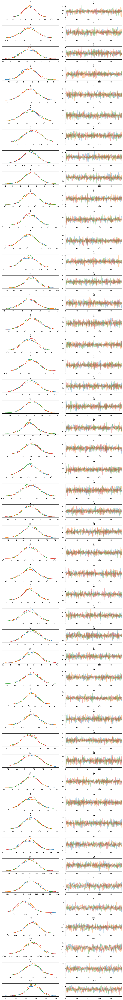

In [ ]:
az.rcParams['plot.max_subplots'] = 450  # Adjust this value according to your needs
az.plot_trace(cmdstanpy_data, compact=False)
plt.tight_layout()

In [ ]:
q1 = np.zeros(40)
q2= np.zeros(40)
q3= np.zeros(40)
posterior = fit.stan_variable(var="c")
c_quantile = []
for i in range(40):
    q1[i]= np.quantile(posterior[:,i], 0.025)
    q2[i]= np.quantile(posterior[:,i], 0.5)
    q3[i]= np.quantile(posterior[:,i], 0.975)
    c_quantile.append((posterior[:,i]).tolist())

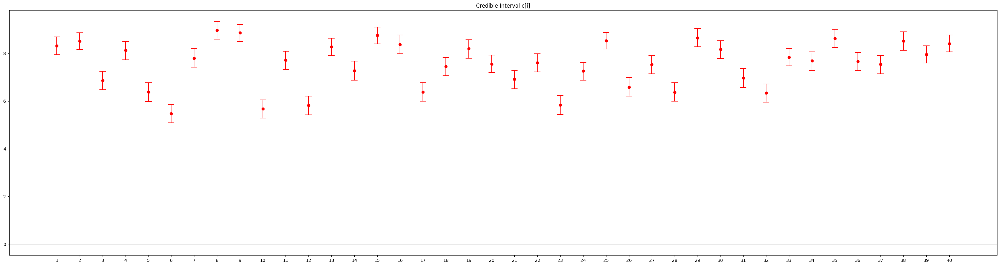

In [ ]:
import matplotlib.patches as mpatches
plt.figure(figsize=(40, 10))
plt.xticks(np.arange(40)+1)
plt.title('Credible Interval c[i]')
plt.axhline(y=0, color= 'black')

for i in range(40):
 plot_credible_interval(i+1, c_quantile[i][:])
plt.savefig('/content/credible_interval_c.png')
plt.show()

In [ ]:
plt.savefig('/content/credible_interval_c.png')

<Figure size 640x480 with 0 Axes>

# CLUSTERING

In [ ]:
# Dati di esempio: numero di eventi in diverse aree geografiche e tempi
xgrid=np.linspace(-100,100,500)
data = {
    'N': data_stan.shape[0],  # Numero totale di osservazioni (spaziali-temporali)
    'T': len(data_stan['data'].unique()),  # Numero di periodi temporali unici (304)
    'I': len(data_stan['id_varco'].unique()),  # Numero di aree geografiche (40)
    'count': data_stan.groupby(['id_varco', 'data'])['numero_transiti'].sum().unstack().values.tolist(),    # Conteggi degli ingressi
    'time': time_matrix,  # Giorno dell'anno dalle date (la formula strana serve per avere valori da 1 a 304)
    'area': data_stan['id_varco'].values,        # Identificatori delle aree geografiche
    'precipitazioni': data_stan['precipitazioni'].values,    # Precipitazioni
    'av_temp': data_stan['av_temp'].values,              # Temperatura media
    'Xt': data_stan[['data', 'precipitazioni','av_temp','estate','inverno']].drop_duplicates().reset_index()[['precipitazioni', 'av_temp','estate','inverno']].transpose(),     #data_stan[['precipitazioni','av_temp']].values.transpose(),
    'Xi': data_stan[['nome_varco','mezzi']].drop_duplicates().reset_index()[['mezzi']].transpose(),

    'fixed_w1':  2*math.pi/7,
    'fixed_w2': 2*math.pi/226,  #226 = numero giorni da 1 gennaio a 15 agosto
    'output': output,
    'mu_c': media,
    'output_flat': np.zeros(I*T, dtype=int),

    'q': 1/7,


    'C': 10,
    'param':2.0,
    #'mu0': 0.0,
    #'s0': 1.0,
    'aa': 4,
    'bb': 0.5,
    'ngrid': len(xgrid),
    'xgrid':xgrid

}

# Definizione del modello in Stan
stan_code = """
functions {
  // Definizione della funzione f(t)
  matrix f_matr(real a, real b, real c, real d, real w1, real w2, matrix t) {
    return a*sin(w1 * t) + b*cos(w1 * t) + c*sin(w2 * t) + d*cos(w2 * t);
  }



  matrix f_ma(real a, real b, real w, matrix A){
    int rows = rows(A);
    int cols = cols(A);
    matrix[rows, cols] result;

    for (i in 1:rows) {
      for (j in 1:cols) {
        result[i, j] = a * sin(w * A[i, j]) + b * cos(w * A[i, j]);
      }
    }
    return result;
  }


}


data {   //30
    int<lower=0> N;                       // Numero totale di osservazioni
    int<lower=0> T;                       // Numero di periodi temporali distinti   20
    int<lower=0> I;                       // Numero di aree geografiche distinti
    array[I,T] real count;             // Conteggi degli eventi
    matrix[I,T] time;        // Periodi temporali
    array[N] real area;        // Identificatori delle aree geografiche
    array[N] real precipitazioni;               // Precipitazioni
    array[N] real av_temp;                      // Temperatura media
    matrix[4,T] Xt;
    matrix[1,I] Xi;
    row_vector[I] mu_c;
    //row_vector[I] coeff;
    array[I * T] int<lower=0> output_flat;
    array[I,T] int<lower=0>  output;
    real fixed_w1;                    // Valore fisso per w
    real fixed_w2;
    real q;

    //clustering:
    //number of components
    int<lower=1> C;

    // DP PARAMATER
    real <lower=0> param;

    //P0 PARAMETER (mu0,s0,a,b)
    //real mu0;
    //real<lower=0> s0;

    real<lower=0> aa;
    real<lower=0> bb;

    int<lower=0> ngrid;
    vector[ngrid] xgrid;

}

parameters {

    row_vector[I] c;
    //row_vector[I] a;
    real a0;
    real b0;
    real a1;
    real b1;
    row_vector[4] beta;                    // Coefficienti per Xt
    //matrix[I, 4] beta;               // Coefficienti per Xt

    //clustering:
    vector<lower=0>[C] vars; //era s_sq
    vector[C] m;
    vector<lower=0, upper=1>[C-1] nus; //era v


} //60

transformed parameters {
    //compute standard deviations
    vector<lower=0>[C] s = sqrt(vars);

    vector<lower=0, upper=1>[C - 1] cumprod_one_minus_nu;
    cumprod_one_minus_nu = exp(cumulative_sum(log1m(nus)));

    //DP weights
    simplex[C] ws; //era eta
    ws[1] = nus[1];
    ws[2:(C - 1)] = nus[2:(C - 1)] .* cumprod_one_minus_nu[1:(C - 2)];
    ws[C] = cumprod_one_minus_nu[C - 1];
}

model {

    // Priors
    c ~ normal(log(mu_c), 0.2);                // c ~ normal(mu_c, 1);

    beta ~ normal(0, 2);

    a0 ~ normal(0, 6);
    b0 ~ normal(0, 6);
    //a ~ normal(5, 2);
    a1 ~ normal(0, 6);
    b1 ~ normal(0, 6);



// Modello di Poisson spazio-temporale con f(t), ci, Xt e Xi    71
    // Calculate lambda values using STAN matrix operations
    matrix[I, T] lambda_matrix = f_matr(a0, b0, a1, b1, fixed_w1, fixed_w2, time) + rep_matrix(c, T)' + rep_matrix(beta*Xt, I);

    // Calculate the Poisson log likelihood using STAN matrix operations
    row_vector[I*T] lambda_row = to_row_vector(lambda_matrix);

    // Calculate the Poisson log likelihood for the entire vectors
    output_flat ~ poisson(exp(lambda_row));  //poisson(to_row_vector(rep_matrix(coeff,T)').*exp(lambda_row));


    // Clustering
    //prior

    //m ~ normal(mu0, s0);
    m[1:C] ~ normal(0, 10*s[1:C]);
    vars ~ inv_gamma(aa, bb);
    nus ~ beta(1, param);


    // Finite Mixture Model
    //likelihood


    for (i in 1:I) {
      array[C] real log_probs;
      for (h in 1:C) {
          log_probs[h] = log(ws[h]) + normal_lpdf(c[i] | m[h], s[h]);
      }
      target += log_sum_exp(log_probs);
    }


}

generated quantities {

    vector[I] cluster_allocs;
    for (i in 1:I) {
      vector[C] log_probs;
      for (h in 1:C) {
          log_probs[h] = log(ws[h]) + normal_lpdf(c[i] | m[h], s[h]);
      }
      cluster_allocs[i] = categorical_rng(softmax(log_probs));
    }

    vector[ngrid] dens;
    for (i in 1:ngrid) {
      array[C] real log_probs;
      for (h in 1:C) {
          log_probs[h] = log(ws[h]) + normal_lpdf(xgrid[i] | m[h], s[h]);
      }
      dens[i] = exp(log_sum_exp(log_probs));
    }



}

"""


In [ ]:
# Create folder to store .stan files
import os
if not os.path.exists("./stan"):
    os.mkdir("./stan")
stan_file = "./stan/prova.stan"
with open(stan_file, "w") as f:
    print(stan_code, file=f)
# Compile stan model
control_data = {'adapt_delta': 0.80}
stan_model = CmdStanModel(stan_file=stan_file, cpp_options=control_data)

DEBUG:cmdstanpy:Removing /content/stan/prova
18:15:08 - cmdstanpy - INFO - compiling stan file /content/stan/prova.stan to exe file /content/stan/prova
INFO:cmdstanpy:compiling stan file /content/stan/prova.stan to exe file /content/stan/prova
DEBUG:cmdstanpy:cmd: make STANCFLAGS+=--filename-in-msg=prova.stan adapt_delta=0.8 /content/stan/prova
cwd: /root/.cmdstan/cmdstan-2.34.1
DEBUG:cmdstanpy:Console output:

--- Translating Stan model to C++ code ---
bin/stanc --filename-in-msg=prova.stan --o=/content/stan/prova.hpp /content/stan/prova.stan

--- Compiling C++ code ---
g++ -std=c++1y -pthread -D_REENTRANT -Wno-sign-compare -Wno-ignored-attributes      -I stan/lib/stan_math/lib/tbb_2020.3/include    -O3 -I src -I stan/src -I stan/lib/rapidjson_1.1.0/ -I lib/CLI11-1.9.1/ -I stan/lib/stan_math/ -I stan/lib/stan_math/lib/eigen_3.4.0 -I stan/lib/stan_math/lib/boost_1.81.0 -I stan/lib/stan_math/lib/sundials_6.1.1/include -I stan/lib/stan_math/lib/sundials_6.1.1/src/sundials    -DBOOST_DISA

In [ ]:
# Esecuzione dell'analisi bayesiana
seed_value = 42
fit = stan_model.sample(data=data,iter_sampling=500, iter_warmup=500, seed = seed_value)

# Visualizzazione dei risultati
print(fit)

DEBUG:cmdstanpy:cmd: /content/stan/prova info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmp225n5y9s/24uewam1.json
18:16:36 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/content/stan/prova', 'id=1', 'random', 'seed=42', 'data', 'file=/tmp/tmp225n5y9s/24uewam1.json', 'output', 'file=/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_1.csv', 'method=sample', 'num_samples=500', 'num_warmup=500', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/content/stan/prova', 'id=2', 'random', 'seed=42', 'data', 'file=/tmp/tmp225n5y9s/24uewam1.json', 'output', 'file=/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_2.csv', 'method=sample', 'num_samples=500', 'num_warmup=500', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/content/stan/prova', 'id=3', 'random', 'seed=42', 'data', 'file=/tmp/tmp225n5y9s/24uewam1.json', 'output', 'file=/tmp/tmp225n5y9s/provajs2g3b9p/prova-202402141

18:37:58 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/content/stan/prova', 'id=1', 'random', 'seed=42', 'data', 'file=/tmp/tmp225n5y9s/24uewam1.json', 'output', 'file=/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_1.csv', 'method=sample', 'num_samples=500', 'num_warmup=500', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_1.csv
 console_msgs (if any):
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 500
    num_warmup = 500
    save_warmup = 0 (Default)
    thin = 1 (Default)
    adapt
      engaged = 1 (Default)
      gamma = 0.05 (Default)
      delta = 0.8 (Default)
      kappa = 0.75 (Default)
      t0 = 10 (Defa


CmdStanMCMC: model=prova chains=4['method=sample', 'num_samples=500', 'num_warmup=500', 'algorithm=hmc', 'adapt', 'engaged=1']
 csv_files:
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_1.csv
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_2.csv
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_3.csv
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_4.csv
 output_files:
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_0-stdout.txt
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_1-stdout.txt
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_2-stdout.txt
	/tmp/tmp225n5y9s/provajs2g3b9p/prova-20240214181637_3-stdout.txt


In [ ]:
# Convert to arviz data type
az.InferenceData(posterior=fit.draws_xr())
cmdstanpy_data = az.from_cmdstanpy(fit)
np.sum(cmdstanpy_data.sample_stats.diverging)

<xarray.DataArray 'diverging' ()>
array(0)

/usr/local/lib/python3.10/dist-packages/arviz/plots/traceplot.py:222: UserWarning: rcParams['plot.max_subplots'] (70) is smaller than the number of variables to plot (646), generating only 70 plots
  warnings.warn(


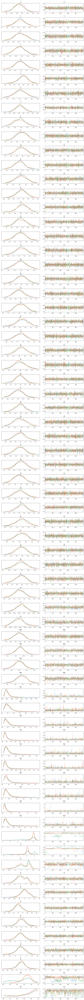

In [ ]:
az.rcParams['plot.max_subplots'] = 140  # Adjust this value according to your needs
az.plot_trace(cmdstanpy_data, compact=False)
plt.tight_layout()


In [ ]:
clustering=fit.stan_variable(var='cluster_allocs')
np.shape(clustering)

(2000, 40)

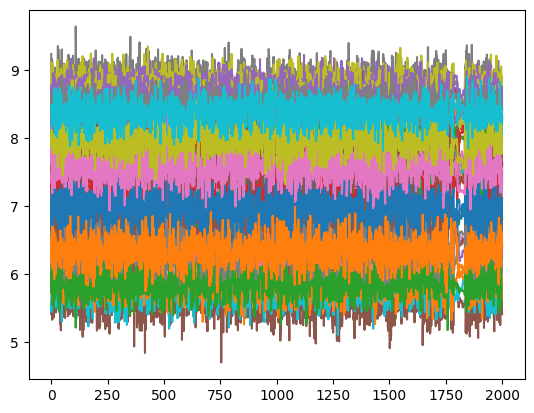

In [ ]:
c_plot = fit.stan_variable(var='c')
plt.plot(c_plot)

Text(0.5, 1.0, 'Clusters for each iteration')

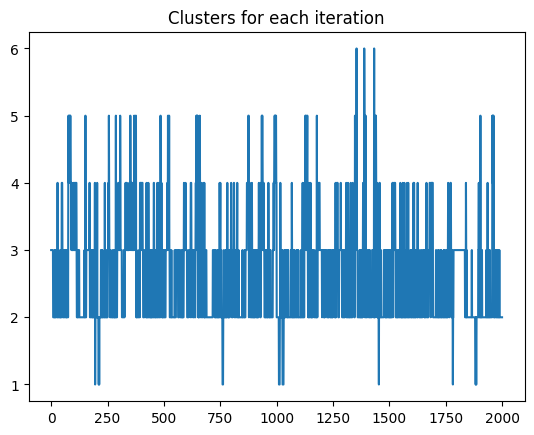

In [ ]:
num_cluster_iter=np.zeros(clustering.shape[0])
for i in range(clustering.shape[0]):
  num_cluster_iter[i]=(np.unique(clustering[i,:])).shape[0]
plt.savefig('/content/clustering_1.png')
plt.plot(num_cluster_iter)
plt.title('Clusters for each iteration')

Text(0.5, 1.0, 'Histogram of clusters per iteration')

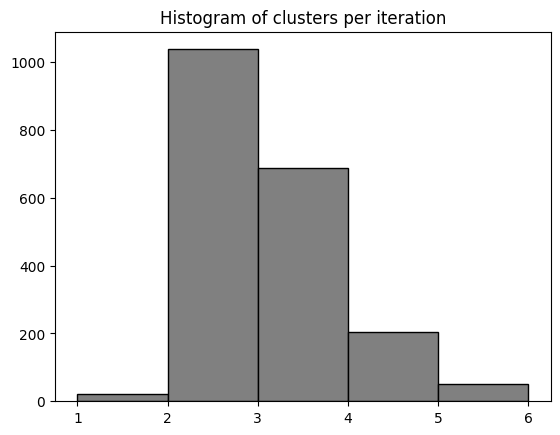

In [ ]:
plt.savefig('/content/clustering_2.png')
plt.hist(num_cluster_iter,bins=5,facecolor='grey',edgecolor='black')
plt.title('Histogram of clusters per iteration')

In [ ]:
plt.savefig('/content/clustering_22.png')
az.plot_trace(cmdstanpy_data, var_names=['cluster_allocs'],combined=True)
plt.show()

In [ ]:
q1 = np.zeros(40)
q2= np.zeros(40)
q3= np.zeros(40)
posterior = fit.stan_variable(var="c")
c_quantile = []
for i in range(40):
    q1[i]= np.quantile(posterior[:,i], 0.025)
    q2[i]= np.quantile(posterior[:,i], 0.5)
    q3[i]= np.quantile(posterior[:,i], 0.975)
    c_quantile.append((posterior[:,i]).tolist())

In [ ]:
import matplotlib.patches as mpatches
plt.figure(figsize=(40, 7))
plt.xticks(np.arange(40)+1)
plt.title('Credible Interval')
plt.axhline(y=0, color= 'black')

for i in range(40):
 plot_credible_interval(i+1, c_quantile[i][:])
plt.savefig('/content/clustering_3.png')
plt.show()

In [ ]:
np.savetxt('cluster_allocs_ok.csv', clustering, delimiter=',')

next steps on R -> file: salso and then we obtain the labels using salso.

In [ ]:
labels=np.array([1,1, 2, 1, 2, 2, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 1, 1 ,2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
labels

In [ ]:
len(labels)

In [ ]:
possible_clusters = np.unique (labels)
possible_clusters
possible_clusters.shape[0] #sum of cluster

In [ ]:
plt.figure(figsize=(40, 7))
plt.xticks(np.arange(40)+1)
plt.title('Credible Interval c[i] coloured by clusters')
plt.axhline(y=0, color= 'black')
for i in range(40):
 plot_credible_interval_cluster(i+1, c_quantile[i][:], labels[i], possible_clusters)
plt.savefig('/content/clustering_4.png')
plt.show()

In [ ]:
def plot_clusters(data_frame, cluster_vec, column_name):
    if column_name not in data_frame.columns.tolist():
      print("Errore: colonna " + column_name + " non presente nel dataset ")
      return

    if len(data_frame['data'].unique()) > 20:
      plt.figure(figsize=(35, 7))
    else:
      plt.figure(figsize=(20, 4))

    n_color = pd.Series(cluster_vec).unique().shape[0]
    colors = cm.tab10.colors[:n_color]  # Genera colori in base al numero di varchi
    n_cluster = n_color

    for cl in range(1, n_color + 1):
      varco_data = data_frame[data_frame['cluster'] == cl]
      plt.scatter(varco_data['data'], varco_data[column_name], marker='o', color=colors[cl-1], label=cluster_vec[cl])
      #plt.plot(varco_data['data'].to_numpy(), varco_data[column_name].to_numpy(), linestyle='-', color=colors[cl-1], label=cluster_vec[cl])

    plt.legend(loc='upper left', fontsize='x-large')
    plt.title('Timeseries '+ column_name + ' giornalieri 2023', fontsize='x-large')
    plt.xlabel('Data', fontsize='x-large')
    plt.ylabel('Numero transiti', fontsize='x-large')
    plt.show()

In [ ]:
v = pd.Series(labels)

data_stan['cluster'] = 0
for i in range(1,max(data_stan['id_varco'])+1):
  data_stan.loc[data_stan['id_varco'] == i, 'cluster'] = v[i-1]

plt.figure(figsize=(40, 25))
plt.savefig('/content/clustering_5.png')
plot_clusters(data_stan,v,'numero_transiti')